/home/emanuele/programs/anaconda3/envs/phd_24/lib/python3.8/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"
/tmp/ipykernel_9614/3094944880.py:115: MatplotlibDeprecationWarning: The seaborn styles shipped by Matplotlib are deprecated since 3.6, as they no longer correspond to the styles shipped by seaborn. However, they will remain available as 'seaborn-v0_8-<style>'. Alternatively, directly use the seaborn API instead.
  plt.style.use('seaborn-whitegrid')
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not fou

Plot saved as PDF: /home/emanuele/post_doc/codici/kefalonia/output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2/orionidas_kefalonia_plot.pdf


findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.
findfont: Font family 'Montserrat' not found.


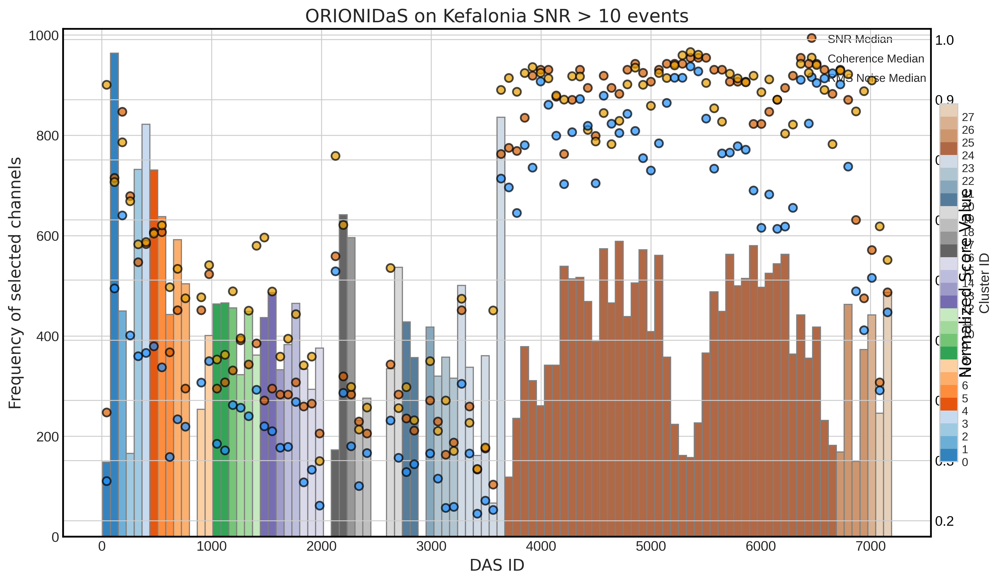

In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import seaborn as sns
from matplotlib.colors import ListedColormap, BoundaryNorm

# -------------------------
# Main Folder Path
# -------------------------
#main_folder = "/home/emanuele/post_doc/codici/kefalonia/output_orionidas_strong_selection_high_freq"
#main_folder = "/home/emanuele/post_doc/codici/kefalonia/output_orionidas_weak_selection_high_freq"
#main_folder = "/home/emanuele/post_doc/codici/kefalonia/output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected"
main_folder = "/home/emanuele/post_doc/codici/kefalonia/output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2"

# -------------------------
# Data containers
# -------------------------
zero_vals = []
second_vals = []
third_vals = []
fifth_vals = []
sixth_vals = []  # 6th column

# -------------------------
# Traverse and collect
# -------------------------
for root, dirs, files in os.walk(main_folder):
    for file in files:
        if file == "selected_waveforms.txt":
            filepath = os.path.join(root, file)
            try:
                data = np.genfromtxt(filepath, skip_header=1, usecols=None)
                if data.ndim == 1:
                    data = data.reshape(1, -1)

                zero_vals.extend(data[:, 0].astype(int))
                second_vals.extend(data[:, 1])
                third_vals.extend(data[:, 2])
                fifth_vals.extend(data[:, 5])
                sixth_vals.extend(data[:, 6])

            except Exception as e:
                print(f"Could not process {filepath}: {e}")

# Convert to arrays
zero_vals = np.array(zero_vals, dtype=int)
second_vals = np.array(second_vals)
third_vals = np.array(third_vals)
fifth_vals = np.array(fifth_vals)
sixth_vals = np.array(sixth_vals)

# -------------------------
# Cluster Colors (from first snippet)
# -------------------------
unique_zero_vals = sorted(set(zero_vals))
num_clusters = len(unique_zero_vals)

base_palette = sns.color_palette("tab20c", 20)

def transform_color(color, cycle):
    arr = np.array(color)
    if cycle == 0:
        return color
    elif cycle == 1:
        return sns.desaturate(color, 0.5)
    elif cycle == 2:
        return tuple(np.clip(arr * 0.6, 0, 1))
    elif cycle == 3:
        return tuple(0.3 + 0.7 * arr)
    elif cycle == 4:
        return tuple(np.clip(arr * 1.2, 0, 1))
    else:
        return transform_color(color, cycle % 5)

extended_palette = []
for i in range(num_clusters):
    base_color = base_palette[i % 20]
    cycle = i // 20
    extended_palette.append(transform_color(base_color, cycle))

cmap = ListedColormap(extended_palette)
norm = BoundaryNorm(unique_zero_vals + [max(unique_zero_vals) + 1], cmap.N)

# -------------------------
# Histogram bins
# -------------------------
num_bins = 100
counts, bins = np.histogram(second_vals, bins=num_bins)
bin_centers = 0.5 * (bins[:-1] + bins[1:])

third_means = []
fifth_means = []
sixth_medians = []
bin_colors = []

for i in range(len(bins) - 1):
    in_bin = (second_vals >= bins[i]) & (second_vals < bins[i + 1])
    if np.any(in_bin):
        third_means.append(np.median(third_vals[in_bin]))
        fifth_means.append(np.median(fifth_vals[in_bin]))
        sixth_medians.append(np.median(sixth_vals[in_bin]))

        most_common_zero_val = Counter(zero_vals[in_bin]).most_common(1)[0][0]
        bin_colors.append(cmap(norm([most_common_zero_val]))[0])
    else:
        third_means.append(np.nan)
        fifth_means.append(np.nan)
        sixth_medians.append(np.nan)
        bin_colors.append('#cccccc')

# -------------------------
# Plotting
# -------------------------
plt.style.use('seaborn-whitegrid')
fig, ax = plt.subplots(figsize=(14, 8), dpi=400)
bin_width = bins[1] - bins[0]

# Histogram bars
for i in range(len(counts)):
    ax.bar(bin_centers[i], counts[i], width=bin_width,
           color=bin_colors[i], edgecolor='gray', alpha=0.99)

# Axis labels and title
ax.set_xlabel("DAS ID", fontsize=14, family='Montserrat')
ax.set_ylabel("Frequency of selected channels", fontsize=14, family='Montserrat')
ax.set_title("ORIONIDaS on Kefalonia SNR > 10 events", fontsize=16, family='Montserrat')

# Secondary Y-axis for medians
ax_r1 = ax.twinx()
ax_r1.plot(bin_centers, third_means, marker='o', linestyle='None', color='#D55E00',
           markersize=7, markeredgewidth=1.5, markeredgecolor='black', alpha=0.7, label='SNR Median')
ax_r1.plot(bin_centers, fifth_means, marker='o', linestyle='None', color='#E69F00',
           markersize=7, markeredgewidth=1.5, markeredgecolor='black', alpha=0.7, label='Coherence Median')
ax_r1.plot(bin_centers, sixth_medians, marker='o', linestyle='None', color='dodgerblue',
           markersize=7, markeredgewidth=1.5, markeredgecolor='black', alpha=0.7, label='RMS Noise Median')

# Ticks and styling
ax_r1.set_ylabel("Normalized Score Value", fontsize=14, family='Montserrat', color='black')
ax_r1.tick_params(axis='y', labelcolor='black', labelsize=12)
ax.tick_params(axis='x', labelsize=12)
ax.tick_params(axis='y', labelsize=12)

# Spine cleanup
for spine in ax.spines.values():
    spine.set_linewidth(1.5)
    spine.set_color('black')
for spine in ax_r1.spines.values():
    spine.set_linewidth(1.5)
    spine.set_color('black')
ax.spines['top'].set_visible(True)
ax_r1.spines['top'].set_visible(False)
ax.spines['right'].set_visible(False)

# -------------------------
# Legend (only for attributes)
# -------------------------
lines_r1, labels_r1 = ax_r1.get_legend_handles_labels()
legend = ax.legend(
    lines_r1,
    labels_r1,
    loc='upper right',
    borderaxespad=0,
    fontsize=10,
    frameon=False,
    handlelength=1.2,
    handleheight=1,
    labelspacing=0.7
)

# -------------------------
# Cluster Colorbar
# -------------------------
sm = plt.cm.ScalarMappable(cmap=cmap, norm=norm)
sm.set_array([])
cbar = fig.colorbar(sm, ax=ax, orientation="vertical", fraction=0.02, pad=0.01)
cbar.set_label("Cluster ID", fontsize=12)
cbar.set_ticks(unique_zero_vals)
cbar.set_ticklabels([str(val) for val in unique_zero_vals])

# -------------------------
# Save Figure
# -------------------------
output_path = os.path.join(main_folder, "orionidas_kefalonia_plot.pdf")
fig.savefig(output_path, format="pdf", bbox_inches="tight")

print(f"Plot saved as PDF: {output_path}")


10 Trace(s) in Stream:
DA.99..HHE   | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.461..HHE  | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.1087..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.1558..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.2377..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.3360..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.4226..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.4761..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.5724..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
DA.6284..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 sampl

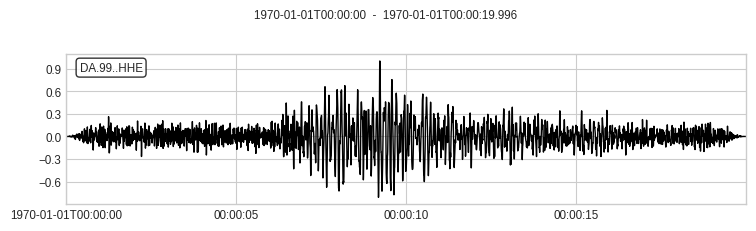

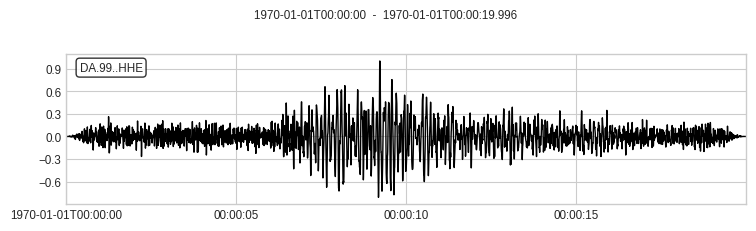

In [2]:
from obspy import read

# Replace with your file path
file_path = main_folder + "/kef0021/selected_traces/selected_traces.mseed"


# Read the MiniSEED file
stream = read(file_path)



print(stream)

# Print stream summary
print(stream[0].stats)

# Plot the waveforms (optional)
stream[0].plot()


93 Trace(s) in Stream:

DA.99..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
...
(91 other traces)
...
DA.7187..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]
         network: DA
         station: 99
        location: 
         channel: HHE
       starttime: 1970-01-01T00:00:00.000000Z
         endtime: 1970-01-01T00:00:19.996000Z
   sampling_rate: 250.0
           delta: 0.004
            npts: 5000
           calib: 1.0
         _format: MSEED
           mseed: AttribDict({'dataquality': 'D', 'number_of_records': 10, 'encoding': 'FLOAT64', 'byteorder': '>', 'record_length': 4096, 'filesize': 3809280})


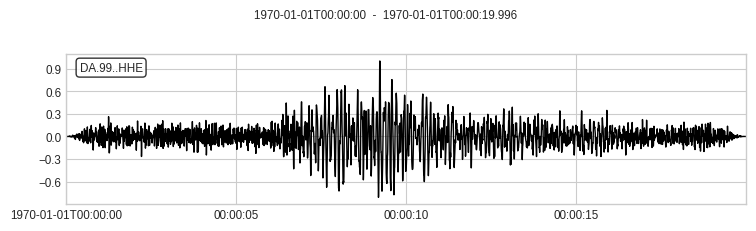

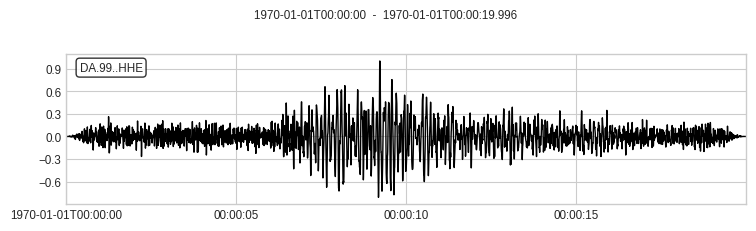

In [145]:
from obspy import read

# Replace with your file path
file_path = main_folder + "/kef0021/selected_traces/full_selected_traces.mseed"


# Read the MiniSEED file
stream = read(file_path)



print(stream)

# Print stream summary
print(stream[0].stats)

# Plot the waveforms (optional)
stream[0].plot()


93 Trace(s) in Stream:

DA.0..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples
...
(91 other traces)
...
DA.7749..HHE | 1970-01-01T00:00:00.000000Z - 1970-01-01T00:00:19.996000Z | 250.0 Hz, 5000 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]
         network: DA
         station: 0
        location: 
         channel: HHE
       starttime: 1970-01-01T00:00:00.000000Z
         endtime: 1970-01-01T00:00:19.996000Z
   sampling_rate: 250.0
           delta: 0.004
            npts: 5000
           calib: 1.0
         _format: MSEED
           mseed: AttribDict({'dataquality': 'D', 'number_of_records': 10, 'encoding': 'FLOAT64', 'byteorder': '>', 'record_length': 4096, 'filesize': 3809280})


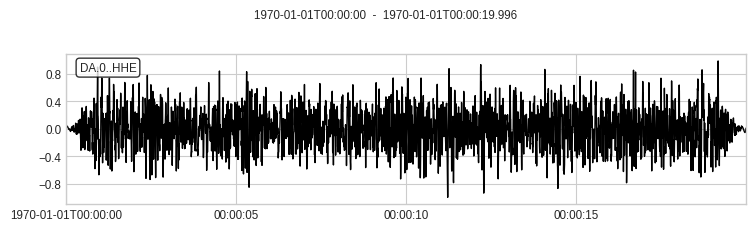

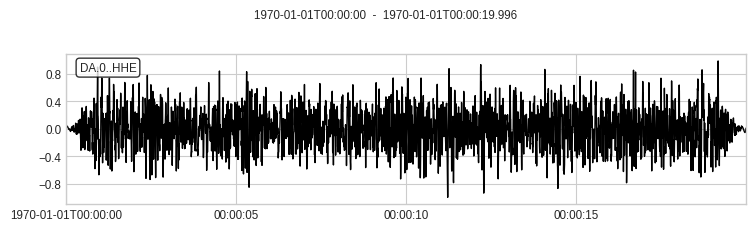

In [146]:
from obspy import read

# Replace with your file path
file_path = main_folder + "/kef0021/selected_traces/full_uniform_traces.mseed"


# Read the MiniSEED file
stream = read(file_path)



print(stream)

# Print stream summary
print(stream[0].stats)

# Plot the waveforms (optional)
stream[0].plot()



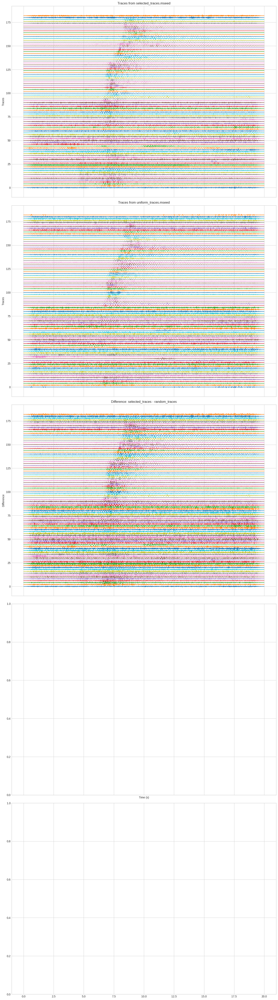

In [148]:
import os
import matplotlib.pyplot as plt
from obspy import read
import re
import numpy as np

# Define file paths
file_path1 = main_folder + "/kef2388/selected_traces/full_selected_traces.mseed"
file_path2 = main_folder + "/kef2388/selected_traces/full_uniform_traces.mseed"
file_path3 = main_folder + "/kef2388/selected_traces/non_selected.mseed"  # New file

# Load streams
stream1 = read(file_path1)
stream2 = read(file_path2)

# Initialize stream3 as None
stream3 = None
if os.path.exists(file_path3):
    stream3 = read(file_path3)

def extract_station_number(tr):
    """Extracts numeric part from station code for sorting."""
    match = re.search(r'\d+', tr.stats.station)
    return int(match.group()) if match else float('inf')

def plot_stacked_traces(ax, stream, title):
    sorted_stream = sorted(stream, key=extract_station_number)
    spacing = max(max(abs(tr.data)) for tr in sorted_stream) * 2
    for i, tr in enumerate(sorted_stream):
        times = tr.times()
        ax.plot(times, tr.data + i * spacing, label=tr.id)
    ax.set_title(title)
    ax.set_ylabel("Traces")
    ax.grid(True)

def plot_difference(ax, stream_a, stream_b, title):
    sorted_a = sorted(stream_a, key=extract_station_number)
    sorted_b = sorted(stream_b, key=extract_station_number)
    spacing = max(max(np.abs(tr.data)) for tr in sorted_a + sorted_b) * 2
    
    for i, (tr_a, tr_b) in enumerate(zip(sorted_a, sorted_b)):
        min_len = min(len(tr_a.data), len(tr_b.data))
        diff = tr_a.data[:min_len] - tr_b.data[:min_len]
        times = tr_a.times()[:min_len]
        ax.plot(times, diff + i * spacing, label=tr_a.id)
    
    ax.set_title(title)
    ax.set_ylabel("Difference")
    ax.grid(True)

# Create subplots with flexible number of plots depending on whether stream3 exists
num_plots = 5 if stream3 is None else 6
fig, axs = plt.subplots(num_plots, 1, figsize=(14, 50), sharex=True)

plot_stacked_traces(axs[0], stream1, "Traces from selected_traces.mseed")
plot_stacked_traces(axs[1], stream2, "Traces from uniform_traces.mseed")

if stream3 is not None:
    plot_stacked_traces(axs[2], stream3, "Traces from non_selected_traces.mseed")
    plot_difference(axs[4], stream1, stream2, "Difference: selected_traces - random_traces")
    axs[5].set_xlabel("Time (s)")
else:
    plot_difference(axs[2], stream1, stream2, "Difference: selected_traces - random_traces")
    axs[3].set_xlabel("Time (s)")

plt.tight_layout()
plt.show()


## STATIONS 

In [149]:
import numpy as np
import os
from tqdm import tqdm
from scipy.signal import detrend, butter, filtfilt, tukey
from obspy import read, Trace, Stream, UTCDateTime

def trace_normalization(data, demean=False):
    if demean:
        data = data - np.mean(data, axis=1, keepdims=True)
    ntrs, npts = np.shape(data)
    for i in range(ntrs):
        nf = np.max(np.abs(data[i, :]))
        if nf != 0:
            data[i, :] = data[i, :] / nf
    return data

def read_stations(
    das_data_path: str,
    output_folder: str,
    sampling_rate: int = 500,
    detrend_data: bool = True,
    apply_filter: bool = True,
    apply_taper: bool = True,
    taper_alpha: float = 0.01,
    low_freq: float = 2.0,
    high_freq: float = 30.0,
    dx: float = 2.0, 
    remove_k0: bool = False
):
    steps = [
        "Loading data",
        "Detrending",
        "Applying taper",
        "Applying filter",
        "Normalizing data",
        "Removing k0 frequency (FK filter)" if remove_k0 else None,
        "Normalizing data after FK filter" if remove_k0 else None,
        "Finished"
    ]
    steps = [step for step in steps if step is not None]
    pbar = tqdm(total=len(steps), desc="read_das_data", unit="step")

    ext = os.path.splitext(das_data_path)[-1].lower()

    if ext == ".npy":
        data = np.load(das_data_path, allow_pickle=True)
        actual_sampling_rate = sampling_rate
        metadata = None

    elif ext in [".mseed", ".miniseed"]:
        st = read(das_data_path)
        st.merge(method=1, fill_value='interpolate')
        metadata = [tr.stats.copy() for tr in st]

        min_length = min(len(tr.data) for tr in st)
        data = np.stack([tr.data[:min_length].astype(np.float32) for tr in st])
        actual_sampling_rate = metadata[0].sampling_rate

    elif ext == ".dat":
        raise NotImplementedError("Add .dat file support if needed.")
    else:
        raise ValueError(f"Unsupported DAS file format: {ext}")

    pbar.update(1)  # Loading data done

    # Detrend
    if detrend_data:
        data = detrend(data, axis=1, type='constant')
        data = detrend(data, axis=1, type='linear')
    pbar.update(1)

    # Taper
    if apply_taper:
        window = tukey(data.shape[1], alpha=taper_alpha)
        data *= window[np.newaxis, :]
    pbar.update(1)

    # Filter
    if apply_filter:
        nyquist = 0.5 * actual_sampling_rate
        low = low_freq / nyquist
        high = high_freq / nyquist
        b, a = butter(N=4, Wn=[low, high], btype='bandpass')
        data = filtfilt(b, a, data, axis=1)
    pbar.update(1)

    # Normalize after filtering etc
    data = trace_normalization(data, demean=False)
    pbar.update(1)

    # Remove k0 if requested
    if remove_k0 and data.shape[0] > 1:
        dt = 1 / actual_sampling_rate
        ntrs, npts = data.shape
        f = np.fft.fftfreq(npts, d=dt)
        k = np.fft.fftfreq(ntrs, d=dx)
        fk = np.fft.fft2(data)
        n, m = fk.shape
        k_vals = np.fft.fftfreq(n, d=dx)
        K = np.tile(k_vals[:, None], (1, m))
        filt = 1 - np.exp(-(K / 0.01) ** 2)
        fkfilt = fk * filt
        data = np.fft.ifft2(fkfilt).real

        # Normalize again after FK filtering
        data = trace_normalization(data, demean=False)
        pbar.update(1)

    pbar.close()

    # Debug: print max abs after normalization (should be 1)
    print("Max absolute value per trace after normalization:")
    print(np.max(np.abs(data), axis=1))

    # Save to stream
    n_traces, n_samples = data.shape
    stream = Stream()

    for i in range(n_traces):
        tr = Trace(data=data[i].astype(np.float32))
        if metadata:
            tr.stats = metadata[i]
        tr.stats.network = "ST"
        stream.append(tr)

    os.makedirs(output_folder, exist_ok=True)
    filename = os.path.splitext(os.path.basename(das_data_path))[0]
    output_path = os.path.join(output_folder, f"{filename}.mseed")
    stream.write(output_path, format="MSEED")

    return data


In [150]:
import os
import matplotlib.pyplot as plt

# === Input and Output Directories ===
input_root = "/media/emanuele/LaCie/Event_waveforms_stations"
output_root = "/home/emanuele/post_doc/codici/kefalonia/orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2"

# === Loop Through All .mseed Files ===
for root, _, files in os.walk(input_root):
    for fname in files:
        if fname.lower().endswith(".mseed"):
            file_path = os.path.join(root, fname)

            # Extract just the base filename without extension
            base_name = os.path.splitext(fname)[0]  # e.g., "kef0140"

            # Define the event folder
            event_folder = os.path.join(output_root, base_name)

            # Define the "stations" subfolder inside it
            output_folder = os.path.join(event_folder, "stations")
            os.makedirs(output_folder, exist_ok=True)

            # Commented out to avoid printing
            # print(f"\nProcessing: {file_path}")
            # print(f"Saving to:   {output_folder}")

            # Call the function
# Example assuming read_stations returns a list or Stream of Trace objects
            station_traces = read_stations(
                das_data_path=file_path,
                output_folder=output_folder,
                sampling_rate=100,
                detrend_data=True,
                apply_filter=True,
                apply_taper=True,
                taper_alpha=0.01,
                low_freq=2.0,
                high_freq=30.0,
                dx=2.0,
                remove_k0=False
            )

            # Now save the normalized traces to output_folder as needed


read_das_data:   0%|          | 0/6 [00:00<?, ?step/s]

read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 257.82step/s]
/home/emanuele/programs/anaconda3/envs/phd_24/lib/python3.8/site-packages/obspy/io/mseed/core.py:790: UserWarning: The encoding specified in trace.stats.mseed.encoding does not match the dtype of the data.
A suitable encoding will be chosen.
  warnings.warn(msg, UserWarning)


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 537.37step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 391.77step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 210.76step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 187.88step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 250.66step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 365.07step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 393.62step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 410.23step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 184.79step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 208.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 188.81step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 275.84step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 316.70step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 266.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 322.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 376.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 146.48step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 106.87step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 95.31step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 154.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 188.29step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 242.71step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 278.40step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 196.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 171.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 189.68step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 90.97step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 380.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 378.80step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 254.47step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 384.82step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 380.14step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 381.35step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 231.94step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 273.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 316.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 136.50step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 94.56step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 190.70step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 182.10step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 63.91step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 337.25step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 210.11step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 154.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 181.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.43step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 197.10step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 160.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 188.29step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 111.92step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 106.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 214.41step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 194.49step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 229.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 175.49step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 340.74step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 192.92step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 188.94step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 156.80step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 375.56step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 217.15step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 349.00step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 304.90step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 307.30step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 270.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 275.34step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 362.48step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 196.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 355.26step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 347.53step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 345.47step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 65.51step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 99.23step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 187.94step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 158.35step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 187.31step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 111.34step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 255.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 90.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 224.39step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 307.48step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 229.59step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 108.15step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 337.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 315.42step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 344.00step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 255.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 292.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 186.11step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 150.23step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 180.17step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 151.06step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 175.48step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 175.28step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 196.89step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 363.99step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 189.98step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 118.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 108.38step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.01step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 104.43step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 239.64step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 177.25step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 181.61step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 77.09step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 85.82step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 137.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 133.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 118.93step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 129.68step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 265.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 188.12step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 306.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 299.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 94.12step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 153.34step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 134.55step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 173.66step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 133.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 179.35step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 90.82step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 158.69step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 131.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 191.65step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.82step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 293.81step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 318.49step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 292.89step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 305.76step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 193.09step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 124.06step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 163.92step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 177.51step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 191.67step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 206.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 278.16step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 177.26step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.37step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 132.71step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 131.85step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 172.66step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 140.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 76.59step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 71.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 183.15step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 119.32step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 190.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 302.97step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 273.49step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 332.51step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 170.85step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 171.20step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 118.83step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 101.36step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 228.16step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 339.64step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 308.52step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 337.91step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 349.97step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 307.80step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 234.84step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 295.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 181.27step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 149.31step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 161.04step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 215.19step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 371.30step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 367.98step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 150.08step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 171.04step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 256.06step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 349.29step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 367.65step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 313.99step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 342.47step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 339.69step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 199.05step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 194.56step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 156.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 157.27step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 146.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 267.17step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 166.84step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 354.05step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 92.37step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 158.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 152.13step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 238.52step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 324.01step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 187.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 154.93step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 343.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 355.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 207.45step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 330.32step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 119.07step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 152.55step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 155.01step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 172.60step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 169.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 160.11step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 153.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 191.08step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 146.38step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 106.85step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 145.75step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 262.60step/s]

Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]



read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 191.93step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.92step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 178.10step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 161.45step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 72.65step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 106.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 122.52step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 100.15step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 283.77step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 226.58step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 154.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 173.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 183.42step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 219.20step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 196.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 174.25step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 320.81step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 243.75step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 216.51step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 215.89step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 188.59step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 172.78step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 176.40step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 161.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 145.07step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 121.77step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 167.64step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 201.29step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 333.76step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 354.21step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 228.07step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 311.09step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 318.30step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 179.30step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 348.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 151.74step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 185.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 179.93step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 107.00step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 150.20step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 193.60step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 189.27step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 148.98step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 126.58step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 136.11step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 170.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 244.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 291.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 239.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 344.30step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 124.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 218.73step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 285.43step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 303.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 282.56step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 334.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 147.84step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 164.26step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 258.80step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 236.21step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 233.96step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 294.65step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 344.39step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 328.40step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 194.80step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 234.66step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 334.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 180.09step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 232.62step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 309.12step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 165.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 178.01step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 196.91step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 120.47step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 204.73step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 367.26step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 178.48step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 305.63step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 256.75step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 168.74step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 240.09step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 75.60step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 199.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 271.58step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 241.07step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 327.55step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 261.81step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 314.51step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 308.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 152.58step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 172.88step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 182.19step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 173.92step/s]

Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]



read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 159.76step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 174.06step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 174.41step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 121.07step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 80.42step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 138.77step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 87.23step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 104.16step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 135.06step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 337.11step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 354.67step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 350.65step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 349.97step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 269.55step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 139.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 116.29step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 208.88step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 213.33step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 274.54step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 306.40step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 272.50step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 306.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 180.79step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 141.19step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 217.82step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 304.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 383.71step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 304.71step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 269.32step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 397.60step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 213.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 361.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 256.74step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 92.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 200.88step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 143.77step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 307.43step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 374.85step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 435.41step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 304.13step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 409.85step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 365.44step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 331.67step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 176.43step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 126.66step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 183.55step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 331.38step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 174.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 268.93step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 263.31step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 348.75step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 180.16step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 186.13step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 251.60step/s]

Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]



read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 197.93step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 216.17step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 328.95step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 173.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 172.19step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 76.35step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 106.29step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 144.94step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 158.67step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 234.26step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 175.41step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 178.64step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 175.65step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 178.99step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 348.34step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 167.21step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 312.58step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 260.12step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 169.02step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 274.75step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 285.45step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 347.40step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 132.01step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 86.47step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 173.40step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 173.89step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 195.18step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 28.25step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 155.48step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 171.21step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 171.92step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 97.46step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 179.04step/s]

Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]



read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 318.32step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 119.03step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 236.90step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 151.49step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 214.79step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 152.13step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 141.86step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 246.12step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 230.72step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 305.99step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 323.82step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 298.71step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 193.74step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 126.22step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 164.57step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 116.68step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 137.28step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


read_das_data:  83%|████████▎ | 5/6 [00:00<00:00, 136.27step/s]


Max absolute value per trace after normalization:
[ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.  1.
  1.  1.  1.]


21 Trace(s) in Stream:

ST.ATHR..HHE | 2024-08-02T00:20:18.050000Z - 2024-08-02T00:20:38.050000Z | 100.0 Hz, 2001 samples
...
(19 other traces)
...
ST.ITHC..HHZ | 2024-08-02T00:20:18.050000Z - 2024-08-02T00:20:38.050000Z | 100.0 Hz, 2001 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


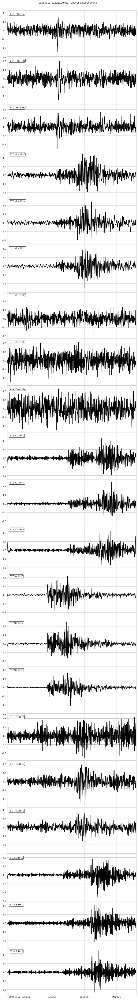

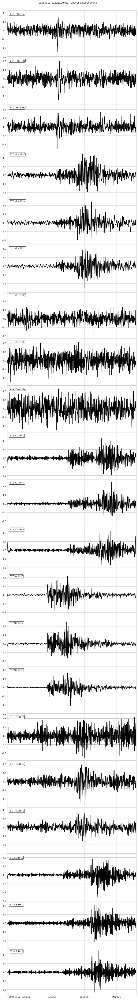

In [3]:
a = read('/home/emanuele/post_doc/codici/kefalonia/orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef0021/stations/kef0021.mseed')

print(a)

a.plot()

In [154]:
import os
import shutil

output_root = "orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2"

# Loop through each subfolder that starts with 'kef'
for folder_name in os.listdir(main_folder):
    print("🔍 Checking folder:", folder_name)
    if not folder_name.startswith("kef"):
        continue

    subfolder_path = os.path.join(main_folder, folder_name)
    selected_traces_path = os.path.join(subfolder_path, "selected_traces")

    full_selected_file = os.path.join(selected_traces_path, "full_selected_traces.mseed")
    full_uniform_file = os.path.join(selected_traces_path, "full_uniform_traces.mseed")
    non_selected_file = os.path.join(selected_traces_path, "non_selected.mseed")

    # Base output folder for this folder_name
    base_output_folder = os.path.join(output_root, folder_name)

    if not os.path.exists(non_selected_file):
        # Prepare output subfolders
        fiber_orion = os.path.join(base_output_folder, "fiber_orion")
        fiber_uniform = os.path.join(base_output_folder, "fiber_uniform")

        os.makedirs(fiber_orion, exist_ok=True)
        os.makedirs(fiber_uniform, exist_ok=True)

        # Copy files
        shutil.copy2(full_selected_file, os.path.join(fiber_orion, f"{folder_name}_orion.mseed"))
        shutil.copy2(full_uniform_file, os.path.join(fiber_uniform, f"{folder_name}_uniform.mseed"))

        print(f"✅ Copied to {fiber_orion} and {fiber_uniform}")

    else:
        print(f"📁 Processing: {folder_name}")

        fiber_orion = os.path.join(base_output_folder, "fiber_orion")
        fiber_uniform = os.path.join(base_output_folder, "fiber_uniform")
        fiber_non_selected = os.path.join(base_output_folder, "fiber_non_selected")

        os.makedirs(fiber_orion, exist_ok=True)
        os.makedirs(fiber_uniform, exist_ok=True)
        os.makedirs(fiber_non_selected, exist_ok=True)

        shutil.copy2(full_selected_file, os.path.join(fiber_orion, f"{folder_name}_orion.mseed"))
        shutil.copy2(full_uniform_file, os.path.join(fiber_uniform, f"{folder_name}_uniform.mseed"))
        shutil.copy2(non_selected_file, os.path.join(fiber_non_selected, f"{folder_name}_non_selected.mseed"))

        print(f"✅ Copied to {fiber_orion}, {fiber_uniform}, and {fiber_non_selected}")


🔍 Checking folder: kef4266
✅ Copied to orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef4266/fiber_orion and orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef4266/fiber_uniform
🔍 Checking folder: kef5008
✅ Copied to orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef5008/fiber_orion and orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef5008/fiber_uniform
🔍 Checking folder: kef5069
✅ Copied to orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef5069/fiber_orion and orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef5069/fiber_uniform
🔍 Checking folder: kef3902
✅ Copied to orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef3902/fiber_orion and orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2/kef3902/fiber_uniform
🔍 Checking folder: kef4341
✅ Copied to orion_das_high_freq_complete_weak_less_subsection_also_non_se

#HYBRID

In [ ]:
import os
from obspy import read, Stream
import numpy as np
import matplotlib.pyplot as plt

def resample_trace(trace, target_sampling_rate):
    """Resample trace to match target sampling rate."""
    if trace.stats.sampling_rate == target_sampling_rate:
        return trace.copy()
    duration = trace.stats.npts / trace.stats.sampling_rate
    new_npts = int(duration * target_sampling_rate)
    resampled_data = np.interp(
        np.linspace(0, duration, new_npts),
        np.linspace(0, duration, trace.stats.npts),
        trace.data
    )
    new_trace = trace.copy()
    new_trace.data = resampled_data.astype(trace.data.dtype)
    new_trace.stats.sampling_rate = target_sampling_rate
    return new_trace

def combine_station_and_orion_traces(
    station_root,
    selection_root,
    folder_name,
    do_plot=False
):
    stations_path = os.path.join(station_root, folder_name, "stations")
    orion_file = os.path.join(selection_root, folder_name, "selected_traces", "full_selected_traces.mseed")

    if not os.path.exists(stations_path):
        print(f"[ERROR] Missing stations folder: {stations_path}")
        return
    if not os.path.exists(orion_file):
        print(f"[ERROR] Missing Orion file: {orion_file}")
        return

    station_files = [f for f in os.listdir(stations_path) if f.endswith(".mseed")]
    if not station_files:
        print(f"[WARN] No station files in {stations_path}")
        return

    # Load all Orion traces
    orion_stream = read(orion_file)
    orion_horiz = Stream(tr for tr in orion_stream if tr.stats.channel in ['HHE', 'HHN'])

    # Fill in missing horizontal component by duplicating
    channels_present = set(tr.stats.channel for tr in orion_horiz)
    if 'HHE' not in channels_present and 'HHN' in channels_present:
        for tr in orion_horiz.select(channel='HHN'):
            tr_copy = tr.copy()
            tr_copy.stats.channel = 'HHE'
            orion_horiz.append(tr_copy)
    elif 'HHN' not in channels_present and 'HHE' in channels_present:
        for tr in orion_horiz.select(channel='HHE'):
            tr_copy = tr.copy()
            tr_copy.stats.channel = 'HHN'
            orion_horiz.append(tr_copy)

    # Load station traces and collect horizontal
    hybrid_stream = Stream()
    plotted = False

    for st_file in station_files:
        station_path = os.path.join(stations_path, st_file)
        st_stream = read(station_path)
        station_horiz = [tr for tr in st_stream if tr.stats.channel in ['HHE', 'HHN']]
        if not station_horiz:
            print(f"[WARN] No horizontal components in {st_file}, skipping.")
            continue
        hybrid_stream += Stream(station_horiz)


    if len(hybrid_stream) == 0:
        print("[WARN] No station horizontal data found.")
        return

    # Define reference start time and sampling rate from stations
    ref_start = min(tr.stats.starttime for tr in hybrid_stream)
    ref_sr = hybrid_stream[0].stats.sampling_rate

    # Resample and align Orion traces
    for tr in orion_horiz:
        tr_resampled = resample_trace(tr, ref_sr)
        tr_resampled.stats.starttime = ref_start
        hybrid_stream.append(tr_resampled)

        if do_plot and not plotted:
            plotted = True
            times = np.arange(tr_resampled.stats.npts) / ref_sr
            plt.figure(figsize=(12, 4))
            plt.plot(times, tr_resampled.data, label=f"Orion {tr.stats.channel}")
            plt.title(f"Sample Orion Trace ({tr.stats.channel})")
            plt.xlabel("Time [s]")
            plt.ylabel("Amplitude")
            plt.legend()
            plt.grid()
            plt.tight_layout()
            plt.show()

    # Set uniform network code to 'HY'
    for tr in hybrid_stream:
        tr.stats.network = "HY"

    # Normalize all traces (unit amplitude)
    for tr in hybrid_stream:
        max_amp = np.max(np.abs(tr.data))
        if max_amp > 0:
            tr.data = (tr.data / max_amp).astype(tr.data.dtype)

    # Save the combined stream
    hybrid_folder = os.path.join(station_root, folder_name, "hybrid")
    os.makedirs(hybrid_folder, exist_ok=True)
    out_file = os.path.join(hybrid_folder, f"{folder_name}_hybrid_combined.mseed")
    hybrid_stream.write(out_file, format="MSEED")



    print(f"\n✅ Saved combined hybrid file: {out_file}")
    print(f"Total traces in hybrid file: {len(hybrid_stream)}")
    print(f"Included stations: {sorted(set(tr.stats.station for tr in hybrid_stream))}")
    print(f"Included channels: {sorted(set(tr.stats.channel for tr in hybrid_stream))}")

# === Run over selected folders ===
station_root = "orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2"
selection_root = "output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2"
folders = [d for d in os.listdir(selection_root) if d.startswith("kef")]

for i, folder in enumerate(folders):
    combine_station_and_orion_traces(
        station_root,
        selection_root,
        folder,
        do_plot=(i == 0)  # show plot only once
    )


[ERROR] Missing Orion file: output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2_new/kef4266/selected_traces/full_selected_traces.mseed
[ERROR] Missing Orion file: output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2_new/kef5008/selected_traces/full_selected_traces.mseed
[ERROR] Missing Orion file: output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2_new/kef5069/selected_traces/full_selected_traces.mseed
[ERROR] Missing Orion file: output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2_new/kef3902/selected_traces/full_selected_traces.mseed
[ERROR] Missing Orion file: output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2_new/kef4341/selected_traces/full_selected_traces.mseed
[ERROR] Missing Orion file: output_orionidas_weak_selection_high_freq_less_subsection_also_non_selected_2_new/kef6604/selected_traces/full_selected_traces.mseed
[ERROR] Missing Orion file: output

In [15]:
import os
import shutil

src = "orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2"
dst = "orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2_prova"

for root, dirs, files in os.walk(src):
    for d in dirs:
        if d == "hybrid2":
            src_dir = os.path.join(root, d)
            # Create corresponding directory in destination
            relative_path = os.path.relpath(src_dir, src)
            dst_dir = os.path.join(dst, relative_path)
            os.makedirs(dst_dir, exist_ok=True)
            
            # Copy all contents from src_dir to dst_dir
            for item in os.listdir(src_dir):
                s = os.path.join(src_dir, item)
                d_ = os.path.join(dst_dir, item)
                if os.path.isdir(s):
                    shutil.copytree(s, d_, dirs_exist_ok=True)
                else:
                    shutil.copy2(s, d_)


200 Trace(s) in Stream:

HY.ATHR..HHE | 2024-08-02T00:20:18.050000Z - 2024-08-02T00:20:38.050000Z | 100.0 Hz, 2001 samples
...
(198 other traces)
...
HY.7187..HHN | 2024-08-02T00:20:18.049999Z - 2024-08-02T00:20:38.039999Z | 100.0 Hz, 2000 samples

[Use "print(Stream.__str__(extended=True))" to print all Traces]


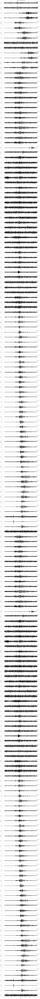

In [10]:
from obspy import read
import matplotlib.pyplot as plt
import numpy as np

# === Define the path to your hybrid file ===
station_root = "orion_das_high_freq_complete_weak_less_subsection_also_non_selected_2"
example_folder = "kef0021"  # ← replace with an actual folder name like "kef0225"
hybrid_path = os.path.join(station_root, example_folder, "hybrid2", f"{example_folder}_hybrid_combined.mseed")

# === Read and filter traces ===
st = read(hybrid_path)
print(st)
horiz_traces = [tr for tr in st if tr.stats.channel in ["HHE", "HHN"]]

if not horiz_traces:
    print("No horizontal components found in hybrid file.")
else:
    plt.figure(figsize=(12, len(horiz_traces) * 1.5))

    for i, tr in enumerate(horiz_traces):
        t = np.arange(tr.stats.npts) / tr.stats.sampling_rate
        plt.subplot(len(horiz_traces), 1, i + 1)
        plt.plot(t, tr.data, label=f"{tr.stats.station}.{tr.stats.channel}", color="black")
        plt.ylabel("Amplitude")
        plt.legend(loc="upper right")
        if i == 0:
            plt.title("Hybrid File: Horizontal Components")
        if i == len(horiz_traces) - 1:
            plt.xlabel("Time (s)")
        else:
            plt.xticks([])

    plt.tight_layout()
    plt.show()
